<a href="https://colab.research.google.com/github/Zeeba1705/atml_PA0/blob/main/Task1_PA1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/Zeeba1705/atml_PA1.git
%cd atml_PA1

Cloning into 'atml_PA1'...
fatal: could not read Username for 'https://github.com': No such device or address
[Errno 2] No such file or directory: 'atml_PA1'
/content


In [2]:
from getpass import getpass

token = getpass("GitHub token: ")

GitHub token: ··········


In [3]:
!git clone https://{token}@github.com/Zeeba1705/atml_PA1.git
%cd atml_PA1

Cloning into 'atml_PA1'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 12 (delta 2), reused 11 (delta 1), pack-reused 0 (from 0)
Receiving objects: 100% (12/12), done.
Resolving deltas: 100% (2/2), done.
/content/atml_PA1


In [4]:
from torchvision.datasets import STL10
from torchvision import transforms

transform = transforms.ToTensor()

train_dataset = STL10(
    root="datasets",
    split="train",
    download=True,
    transform=transform
)

test_dataset = STL10(
    root="datasets",
    split="test",
    download=True,
    transform=transform
)

print(len(train_dataset))
print(len(test_dataset))

100%|██████████| 2.64G/2.64G [11:00<00:00, 4.00MB/s]


5000
8000


In [5]:
from google.colab import drive
drive.mount('/content/drive')

!mkdir -p "/content/drive/MyDrive/atml_PA1"
!cp -r /content/datasets "/content/drive/MyDrive/atml_PA1/"

Mounted at /content/drive
cp: cannot stat '/content/datasets': No such file or directory


In [7]:
!mkdir -p "/content/drive/MyDrive/atml_PA1/datasets"
!cp -r "/content/drive/MyDrive/stl10_binary" "/content/drive/MyDrive/atml_PA1/datasets/"

In [3]:
import numpy as np
from sklearn.model_selection import train_test_split

SEED= 6304

train_labels= np.array(train_dataset.labels)

train_idx, val_idx = train_test_split(np.arange(len(train_dataset)), test_size=0.2,
    stratify=train_labels,random_state=SEED)

print("Train split:", len(train_idx))
print("Val split:", len(val_idx))

Train split: 4000
Val split: 1000


In [9]:
print("Train class counts:", np.bincount(train_labels[train_idx]))
print("Val class counts:", np.bincount(train_labels[val_idx]))

Train class counts: [400 400 400 400 400 400 400 400 400 400]
Val class counts: [100 100 100 100 100 100 100 100 100 100]


In [4]:
test_labels= np.array(test_dataset.labels)

rando= np.random.default_rng(SEED)

selected_test_idx = []

#taking 10 classses, so that we get a balance across classes - 50 per class to make 500
for class_id in range(10):
    class_idx= np.where(test_labels== class_id)[0]
    chosen= rando.choice(class_idx, size=50, replace=False)
    selected_test_idx.extend(chosen)

selected_test_idx= np.array(selected_test_idx)

print("Test subset sze:", len(selected_test_idx))


Test subset sze: 500


In [11]:
print("Test subset class counts:", np.bincount(test_labels[selected_test_idx]))

Test subset class counts: [50 50 50 50 50 50 50 50 50 50]


In [5]:
import os
import json

os.makedirs("splits", exist_ok=True)

da_data = {"train_idx": train_idx.tolist(), "val_idx": val_idx.tolist(),"test_subset_idx": selected_test_idx.tolist()}

with open("splits/stl10_seed6304.json", "w") as f:
    json.dump(da_data, f)

print("Saved.")

Saved.


In [13]:
!ls -lh splits

total 32K
-rw-r--r-- 1 root root 32K Sep 18 12:46 stl10_seed6304.json


In [6]:
with open("splits/stl10_seed6304.json", "r") as f:
    saved = json.load(f)

print(saved.keys())
print(len(saved["train_idx"]))
print(len(saved["val_idx"]))
print(len(saved["test_subset_idx"]))

dict_keys(['train_idx', 'val_idx', 'test_subset_idx'])
4000
1000
500


In [14]:
!pip install open_clip_torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.4 MB/s eta 0:00:00


In [15]:
import torch
import torchvision
import open_clip

from torchvision.models import (
    resnet50,
    ResNet50_Weights,
    vit_b_16,
    ViT_B_16_Weights
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [16]:
#ResNet-50
resnet_weights = ResNet50_Weights.IMAGENET1K_V2
resnet= resnet50(weights=resnet_weights)

#ViT-B/16
vit_weights = ViT_B_16_Weights.IMAGENET1K_V1
vit= vit_b_16(weights=vit_weights)

#CLIP ViT-B/32
clip_model, _, clip_preprocess = open_clip.create_model_and_transforms("ViT-B-32",pretrained="openai")

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 175MB/s]


Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


100%|██████████| 330M/330M [00:02<00:00, 158MB/s]


open_clip_model.safetensors: reconstructing file:   0%|          |  0.00B /  605MB            

open_clip_model.safetensors: downloading bytes:           |  0.00B            

/usr/local/lib/python3.13/dist-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


In [4]:
!mkdir -p "/content/drive/MyDrive/atml_PA1/model_cache"
!cp -r ~/.cache/torch "/content/drive/MyDrive/atml_PA1/model_cache/"

In [17]:
for param in resnet.parameters():
    param.requires_grad = False

for param in vit.parameters():
    param.requires_grad = False

for param in clip_model.parameters():
    param.requires_grad = False

resnet= resnet.to(device)
vit= vit.to(device)
clip_model= clip_model.to(device)

In [18]:
import torch.nn as nn

resnet.fc= nn.Identity()
resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [19]:
vit.heads = nn.Identity()
vit.eval()



VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [20]:
x = torch.randn(1, 3, 224, 224).to(device)

with torch.no_grad():
    feat= vit(x)

print(feat.shape)

torch.Size([1, 768])


In [21]:
clip_model.eval()
with torch.no_grad():
    feat = clip_model.encode_image(x)

print(feat.shape)
feat= feat / feat.norm(dim=-1, keepdim=True)

torch.Size([1, 512])


In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

DRIVE_DATA = "/content/gdrive/MyDrive/atml_PA1/datasets"

from torchvision.datasets import STL10

train_dataset = STL10(
    root=DRIVE_DATA,
    split="train",
    download=False,
    transform=None
)

test_dataset = STL10(
    root=DRIVE_DATA,
    split="test",
    download=False,
    transform=None
)

print(len(train_dataset))
print(len(test_dataset))

Mounted at /content/gdrive
5000
8000


In [2]:
from torchvision import transforms

common_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

imagenet_normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

clip_normalize = transforms.Normalize(
    mean=[0.48145466, 0.4578275, 0.40821073],
    std=[0.26862954, 0.26130258, 0.27577711]
)

In [15]:
image, label = train_dataset[0]

common_image= common_transform(image)

resnet_input= imagenet_normalize(common_image.clone())
vit_input= imagenet_normalize(common_image.clone())
clip_input= clip_normalize(common_image.clone())

print("Common:", common_image.shape)
print("ResNet:", resnet_input.shape)
print("ViT:", vit_input.shape)
print("CLIP:", clip_input.shape)

Common: torch.Size([3, 224, 224])
ResNet: torch.Size([3, 224, 224])
ViT: torch.Size([3, 224, 224])
CLIP: torch.Size([3, 224, 224])


In [8]:
import torch
from torch.utils.data import Dataset, DataLoader


In [9]:
import torch
from torch.utils.data import Dataset, DataLoader

class ModiSTL10(Dataset):
    def __init__(self, base_dataset, indices, common_transform, normalize):
        self.base_dataset= base_dataset
        self.indices= indices
        self.common_transform= common_transform
        self.normalize= normalize

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, i):
        dataset_idx = self.indices[i]

        image, label = self.base_dataset[dataset_idx]
        image = self.common_transform(image)
        image = self.normalize(image)

        return image, label

In [29]:
from torch.utils.data import DataLoader

BATCH_SIZE = 64

train_imagenet_set = ModiSTL10(
    train_dataset,
    train_idx,
    common_transform,
    imagenet_normalize
)

val_imagenet_set = ModiSTL10(
    train_dataset,
    val_idx,
    common_transform,
    imagenet_normalize
)

train_clip_ds = ModiSTL10(
    train_dataset,
    train_idx,
    common_transform,
    clip_normalize
)

val_clip_ds = ModiSTL10(
    train_dataset,
    val_idx,
    common_transform,
    clip_normalize
)

train_imagenet_loader = DataLoader(train_imagenet_set,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

val_imagenet_loader = DataLoader(
    val_imagenet_set,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

train_clip_loader = DataLoader(
    train_clip_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

val_clip_loader = DataLoader(
    val_clip_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

In [30]:
images, labels = next(iter(train_imagenet_loader))

print(images.shape)
print(labels.shape)

torch.Size([64, 3, 224, 224])
torch.Size([64])


In [31]:
def extract_features(model, loader, device, is_clip=False):
    all_features= []
    all_labels= []

    model.eval()

    with torch.no_grad():
        for images, labels in loader:
            images= images.to(device)

            if is_clip:
                features= model.encode_image(images)

                features= features / features.norm(dim=-1,keepdim=True)
            else:
                features = model(images)

            all_features.append(features.cpu())
            all_labels.append(labels)

    all_features= torch.cat(all_features, dim=0)
    all_labels= torch.cat(all_labels, dim=0)

    return all_features, all_labels

In [32]:
resnet_trfeats, train_labels = extract_features(resnet,train_imagenet_loader,device
)

resnet_valfeats, val_labels = extract_features(resnet,val_imagenet_loader,device
)

print("Train features:", resnet_trfeats.shape)
print("Train labels:", train_labels.shape)

print("Val features:", resnet_valfeats.shape)
print("Val labels:", val_labels.shape)

Train features: torch.Size([4000, 2048])
Train labels: torch.Size([4000])
Val features: torch.Size([1000, 2048])
Val labels: torch.Size([1000])


In [33]:

vit_train_features, _ = extract_features(vit,train_imagenet_loader,device
)

vit_val_features, _ = extract_features(vit,val_imagenet_loader,device)

print("ViT train:", vit_train_features.shape)
print("ViT val:", vit_val_features.shape)

clip_train_features, _ = extract_features(clip_model,train_clip_loader,device,is_clip=True
)

clip_val_features, _ = extract_features(clip_model,val_clip_loader,device,is_clip=True
)

print("CLIP train:", clip_train_features.shape)
print("CLIP val:", clip_val_features.shape)

ViT train: torch.Size([4000, 768])
ViT val: torch.Size([1000, 768])
CLIP train: torch.Size([4000, 512])
CLIP val: torch.Size([1000, 512])


In [28]:
import os

FEATURE_DIR = "/content/gdrive/MyDrive/atml_PA1/task1_features"
os.makedirs(FEATURE_DIR, exist_ok=True)

torch.save(resnet_trfeats, f"{FEATURE_DIR}/resnet_train.pt")
torch.save(resnet_valfeats,   f"{FEATURE_DIR}/resnet_val.pt")

torch.save(vit_train_features, f"{FEATURE_DIR}/vit_train.pt")
torch.save(vit_val_features,   f"{FEATURE_DIR}/vit_val.pt")

torch.save(clip_train_features, f"{FEATURE_DIR}/clip_train.pt")
torch.save(clip_val_features,   f"{FEATURE_DIR}/clip_val.pt")

torch.save(train_labels, f"{FEATURE_DIR}/train_labels.pt")
torch.save(val_labels,   f"{FEATURE_DIR}/val_labels.pt")

print("Saved all features.")

Saved all features.


In [34]:
import copy
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

SEED= 6304
torch.manual_seed(SEED)


def train_one_epoch(head, loader, optimizer, criterion, device):
    head.train()

    total_loss= 0.0
    total_correct= 0
    total_examples= 0

    for features, labels in loader:
        features= features.to(device)
        labels= labels.to(device)

        optimizer.zero_grad()

        logits= head(features)
        loss= criterion(logits, labels)

        loss.backward()
        optimizer.step()

        total_loss+= loss.item() * labels.size(0)

        predictions = logits.argmax(dim=1)
        total_correct += (predictions == labels).sum().item()
        total_examples += labels.size(0)

    avg_loss = total_loss / total_examples
    accuracy = total_correct / total_examples

    return avg_loss, accuracy


def validate(head, loader, criterion, device):
    head.eval()

    total_loss = 0.0
    total_correct = 0
    total_examples = 0

    with torch.no_grad():
        for features, labels in loader:
            features = features.to(device)
            labels = labels.to(device)

            logits = head(features)
            loss = criterion(logits, labels)

            total_loss += loss.item() * labels.size(0)

            predictions = logits.argmax(dim=1)
            total_correct += (predictions == labels).sum().item()
            total_examples += labels.size(0)

    avg_loss = total_loss / total_examples
    accuracy = total_correct / total_examples

    return avg_loss, accuracy


def train_linear_head(train_features,train_labels,val_features,val_labels,
    input_dim,num_classes=10, batch_size=128, max_epochs=50,
    lr=1e-3, weight_decay=1e-4,patience=5):

    train_dataset = TensorDataset(
        train_features.float(),
        train_labels.long()
    )

    val_dataset = TensorDataset(
        val_features.float(),
        val_labels.long()
    )

    generator = torch.Generator()
    generator.manual_seed(SEED)

    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=True,
        generator=generator
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False
    )

    head = nn.Linear(input_dim, num_classes).to(device)

    criterion = nn.CrossEntropyLoss()

    optimizer = torch.optim.AdamW(
        head.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": []
    }

    best_val_acc = -1.0
    best_state = None
    epochs_without_improvement = 0

    for epoch in range(max_epochs):

        train_loss, train_acc = train_one_epoch(
            head,
            train_loader,
            optimizer,
            criterion,
            device
        )

        val_loss, val_acc = validate(
            head,
            val_loader,
            criterion,
            device
        )

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        print(
            f"Epoch {epoch + 1:02d} | "
            f"Train loss: {train_loss:.4f} | "
            f"Train acc: {train_acc:.4f} | "
            f"Val loss: {val_loss:.4f} | "
            f"Val acc: {val_acc:.4f}"
        )

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_state = copy.deepcopy(head.state_dict())
            epochs_without_improvement = 0

        else:
            epochs_without_improvement += 1

        if epochs_without_improvement >= patience:
            print("Early stopping.")
            break

    head.load_state_dict(best_state)

    return head, history

In [35]:
resnet_head, resnet_history = train_linear_head(
    resnet_trfeats,
    train_labels,
    resnet_valfeats,
    val_labels,
    input_dim=2048
)

Epoch 01 | Train loss: 1.4742 | Train acc: 0.7980 | Val loss: 0.8414 | Val acc: 0.9540
Epoch 02 | Train loss: 0.5678 | Train acc: 0.9725 | Val loss: 0.4243 | Val acc: 0.9580
Epoch 03 | Train loss: 0.3102 | Train acc: 0.9775 | Val loss: 0.2844 | Val acc: 0.9630
Epoch 04 | Train loss: 0.2116 | Train acc: 0.9830 | Val loss: 0.2204 | Val acc: 0.9660
Epoch 05 | Train loss: 0.1601 | Train acc: 0.9848 | Val loss: 0.1847 | Val acc: 0.9700
Epoch 06 | Train loss: 0.1280 | Train acc: 0.9878 | Val loss: 0.1602 | Val acc: 0.9720
Epoch 07 | Train loss: 0.1064 | Train acc: 0.9882 | Val loss: 0.1450 | Val acc: 0.9710
Epoch 08 | Train loss: 0.0900 | Train acc: 0.9908 | Val loss: 0.1337 | Val acc: 0.9710
Epoch 09 | Train loss: 0.0781 | Train acc: 0.9918 | Val loss: 0.1251 | Val acc: 0.9720
Epoch 10 | Train loss: 0.0684 | Train acc: 0.9932 | Val loss: 0.1188 | Val acc: 0.9710
Epoch 11 | Train loss: 0.0606 | Train acc: 0.9938 | Val loss: 0.1127 | Val acc: 0.9720
Early stopping.


In [36]:
vit_head, vit_history = train_linear_head(
    vit_train_features,
    train_labels,
    vit_val_features,
    val_labels,
    input_dim=768
)

Epoch 01 | Train loss: 1.0640 | Train acc: 0.8045 | Val loss: 0.3663 | Val acc: 0.9590
Epoch 02 | Train loss: 0.2270 | Train acc: 0.9760 | Val loss: 0.1876 | Val acc: 0.9720
Epoch 03 | Train loss: 0.1326 | Train acc: 0.9820 | Val loss: 0.1431 | Val acc: 0.9720
Epoch 04 | Train loss: 0.0972 | Train acc: 0.9872 | Val loss: 0.1213 | Val acc: 0.9760
Epoch 05 | Train loss: 0.0769 | Train acc: 0.9890 | Val loss: 0.1085 | Val acc: 0.9780
Epoch 06 | Train loss: 0.0629 | Train acc: 0.9898 | Val loss: 0.0999 | Val acc: 0.9790
Epoch 07 | Train loss: 0.0523 | Train acc: 0.9925 | Val loss: 0.0937 | Val acc: 0.9790
Epoch 08 | Train loss: 0.0446 | Train acc: 0.9940 | Val loss: 0.0893 | Val acc: 0.9790
Epoch 09 | Train loss: 0.0382 | Train acc: 0.9952 | Val loss: 0.0860 | Val acc: 0.9780
Epoch 10 | Train loss: 0.0332 | Train acc: 0.9965 | Val loss: 0.0830 | Val acc: 0.9790
Epoch 11 | Train loss: 0.0291 | Train acc: 0.9978 | Val loss: 0.0810 | Val acc: 0.9790
Early stopping.


In [37]:
clip_head, clip_history = train_linear_head(
    clip_train_features,
    train_labels,
    clip_val_features,
    val_labels,
    input_dim=512
)

Epoch 01 | Train loss: 2.2226 | Train acc: 0.6967 | Val loss: 2.1337 | Val acc: 0.9700
Epoch 02 | Train loss: 2.0572 | Train acc: 0.9637 | Val loss: 1.9743 | Val acc: 0.9760
Epoch 03 | Train loss: 1.9016 | Train acc: 0.9698 | Val loss: 1.8240 | Val acc: 0.9810
Epoch 04 | Train loss: 1.7550 | Train acc: 0.9710 | Val loss: 1.6830 | Val acc: 0.9810
Epoch 05 | Train loss: 1.6177 | Train acc: 0.9705 | Val loss: 1.5513 | Val acc: 0.9800
Epoch 06 | Train loss: 1.4899 | Train acc: 0.9712 | Val loss: 1.4286 | Val acc: 0.9800
Epoch 07 | Train loss: 1.3713 | Train acc: 0.9718 | Val loss: 1.3157 | Val acc: 0.9810
Epoch 08 | Train loss: 1.2624 | Train acc: 0.9730 | Val loss: 1.2117 | Val acc: 0.9830
Epoch 09 | Train loss: 1.1623 | Train acc: 0.9732 | Val loss: 1.1165 | Val acc: 0.9800
Epoch 10 | Train loss: 1.0710 | Train acc: 0.9732 | Val loss: 1.0299 | Val acc: 0.9820
Epoch 11 | Train loss: 0.9881 | Train acc: 0.9738 | Val loss: 0.9511 | Val acc: 0.9820
Epoch 12 | Train loss: 0.9128 | Train acc: 

In [36]:
CHECKPOINT_DIR = "/content/gdrive/MyDrive/atml_PA1/checkpoints"

import os
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

torch.save(resnet_head.state_dict(),
           f"{CHECKPOINT_DIR}/resnet_linear_head.pt")

torch.save(vit_head.state_dict(),
           f"{CHECKPOINT_DIR}/vit_linear_head.pt")

torch.save(clip_head.state_dict(),
           f"{CHECKPOINT_DIR}/clip_linear_head.pt")

import json

history_dir = "/content/gdrive/MyDrive/atml_PA1/results"
os.makedirs(history_dir, exist_ok=True)

with open(f"{history_dir}/resnet_history.json", "w") as f:
    json.dump(resnet_history, f)

with open(f"{history_dir}/vit_history.json", "w") as f:
    json.dump(vit_history, f)

with open(f"{history_dir}/clip_history.json", "w") as f:
    json.dump(clip_history, f)

In [11]:
test_imagenet_ds= ModiSTL10(
    test_dataset,
    selected_test_idx,
    common_transform,
    imagenet_normalize
)

test_clip_ds = ModiSTL10(
    test_dataset,
    selected_test_idx,
    common_transform,
    clip_normalize
)

test_imagenet_loader = DataLoader(
    test_imagenet_ds,
    batch_size=64,
    shuffle=False,
    num_workers=2
)

test_clip_loader = DataLoader(
    test_clip_ds,
    batch_size=64,
    shuffle=False,
    num_workers=2
)

print(len(test_imagenet_ds))
print(len(test_clip_ds))

500
500


In [22]:
resnet_test_features, test_labels = extract_features(
    resnet,
    test_imagenet_loader,
    device
)

vit_test_features, _ = extract_features(
    vit,
    test_imagenet_loader,
    device
)

clip_test_features, _ = extract_features(
    clip_model,
    test_clip_loader,
    device,
    is_clip=True
)

print("ResNet:", resnet_test_features.shape)
print("ViT:", vit_test_features.shape)
print("CLIP:", clip_test_features.shape)
print("Labels:", test_labels.shape)

ResNet: torch.Size([500, 2048])
ViT: torch.Size([500, 768])
CLIP: torch.Size([500, 512])
Labels: torch.Size([500])


In [23]:
from sklearn.metrics import f1_score

def evaluate_linear_head(head, features, labels, device):
    head.eval()

    with torch.no_grad():
        logits= head(features.float().to(device))
        probs= torch.softmax(logits, dim=1)

        confidence, predictions = probs.max(dim=1)

    predictions= predictions.cpu()
    confidence= confidence.cpu()

    accuracy= (predictions == labels).float().mean().item()

    macro_f1 = f1_score(
        labels.numpy(),
        predictions.numpy(),
        average="macro"
    )

    mean_confidence= confidence.mean().item()

    return {
        "accuracy": accuracy,
        "macro_f1": macro_f1,
        "mean_confidence": mean_confidence,
        "predictions": predictions,
        "confidence": confidence
    }

In [38]:
resnet_clean= evaluate_linear_head(
    resnet_head,
    resnet_test_features,
    test_labels,
    device
)

vit_clean= evaluate_linear_head(
    vit_head,
    vit_test_features,
    test_labels,
    device
)

clip_linear_clean= evaluate_linear_head(
    clip_head,
    clip_test_features,
    test_labels,
    device
)

for name, result in [
    ("ResNet", resnet_clean),
    ("ViT", vit_clean),
    ("CLIP Linear", clip_linear_clean)
]:
    print(
        f"{name:12s} | "
        f"Accuracy: {result['accuracy']:.4f} | "
        f"Macro-F1: {result['macro_f1']:.4f} | "
        f"Mean confidence: {result['mean_confidence']:.4f}"
    )

ResNet       | Accuracy: 0.9740 | Macro-F1: 0.9740 | Mean confidence: 0.8963
ViT          | Accuracy: 0.9780 | Macro-F1: 0.9780 | Mean confidence: 0.9437
CLIP Linear  | Accuracy: 0.9740 | Macro-F1: 0.9739 | Mean confidence: 0.3052


In [39]:
class_names = test_dataset.classes
prompts = [
    f"a photo of a {class_name}."
    for class_name in class_names
]

print(prompts)

tokenizer = open_clip.get_tokenizer("ViT-B-32")

text_tokens = tokenizer(prompts).to(device)

['a photo of a airplane.', 'a photo of a bird.', 'a photo of a car.', 'a photo of a cat.', 'a photo of a deer.', 'a photo of a dog.', 'a photo of a horse.', 'a photo of a monkey.', 'a photo of a ship.', 'a photo of a truck.']


In [40]:
with torch.no_grad():
    text_features = clip_model.encode_text(text_tokens)

    text_features = text_features / text_features.norm(
        dim=-1,
        keepdim=True
    )

with torch.no_grad():

    image_features = clip_test_features.float().to(device)

    scale = clip_model.logit_scale.exp()

    logits = scale * image_features @ text_features.T

    probs = torch.softmax(logits, dim=1)

    zero_shot_confidence, zero_shot_predictions = probs.max(dim=1)

In [52]:
zero_shot_predictions = zero_shot_predictions.cpu()
zero_shot_confidence = zero_shot_confidence.cpu()

zero_shot_accuracy = (
    (zero_shot_predictions == test_labels)
    .float()
    .mean()
    .item()
)

zero_shot_macro_f1 = f1_score(
    test_labels.numpy(),
    zero_shot_predictions.numpy(),
    average="macro"
)

zero_shot_mean_confidence = zero_shot_confidence.mean().item()

clip_zeroshot_clean = {
    "accuracy": zero_shot_accuracy,
    "macro_f1": zero_shot_macro_f1,
    "mean_confidence": zero_shot_mean_confidence,
    "predictions": zero_shot_predictions,
    "confidence": zero_shot_confidence
}

print(
    f"CLIP Zero-shot | "
    f"Accuracy: {zero_shot_accuracy:.4f} | "
    f"Macro-F1: {zero_shot_macro_f1:.4f} | "
    f"Mean confidence: {zero_shot_mean_confidence:.4f}"
)

CLIP Zero-shot | Accuracy: 0.9660 | Macro-F1: 0.9655 | Mean confidence: 0.9436


###Gray-Scale Transforms: ###

In [42]:
grayscale_transform= transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor()
])

In [43]:
gray_imagenet_ds= ModiSTL10(
    test_dataset,
    selected_test_idx,
    grayscale_transform,
    imagenet_normalize
)

gray_clip_ds= ModiSTL10(
    test_dataset,
    selected_test_idx,
    grayscale_transform,
    clip_normalize
)

gray_imagenet_loader= DataLoader(
    gray_imagenet_ds,
    batch_size=64,
    shuffle=False,
    num_workers=2
)

gray_clip_loader= DataLoader(
    gray_clip_ds,
    batch_size=64,
    shuffle=False,
    num_workers=2
)

print(len(gray_imagenet_ds), len(gray_clip_ds))

500 500


In [44]:
resnet_gray_features, gray_labels = extract_features(
    resnet,
    gray_imagenet_loader,
    device
)

vit_gray_features, _ = extract_features(
    vit,
    gray_imagenet_loader,
    device
)

clip_gray_features, _ = extract_features(
    clip_model,
    gray_clip_loader,
    device,
    is_clip=True
)


In [45]:
resnet_gray = evaluate_linear_head(
    resnet_head,
    resnet_gray_features,
    gray_labels,
    device
)

vit_gray = evaluate_linear_head(
    vit_head,
    vit_gray_features,
    gray_labels,
    device
)

clip_linear_gray = evaluate_linear_head(
    clip_head,
    clip_gray_features,
    gray_labels,
    device
)

In [46]:
with torch.no_grad():
    image_features = clip_gray_features.float().to(device)

    scale = clip_model.logit_scale.exp()

    logits = scale * image_features @ text_features.T
    probs = torch.softmax(logits, dim=1)

    gray_zero_confidence, gray_zero_predictions = probs.max(dim=1)

In [47]:
gray_zero_predictions = gray_zero_predictions.cpu()
gray_zero_confidence = gray_zero_confidence.cpu()

gray_zero_accuracy = (
    (gray_zero_predictions == gray_labels)
    .float()
    .mean()
    .item()
)

gray_zero_macro_f1 = f1_score(
    gray_labels.numpy(),
    gray_zero_predictions.numpy(),
    average="macro"
)

gray_zero_mean_confidence = gray_zero_confidence.mean().item()

clip_zeroshot_gray = {
    "accuracy": gray_zero_accuracy,
    "macro_f1": gray_zero_macro_f1,
    "mean_confidence": gray_zero_mean_confidence,
    "predictions": gray_zero_predictions,
    "confidence": gray_zero_confidence
}

In [48]:
def pred_consistency(clean, transformed):
   return (clean==transformed).float().mean().item()

In [50]:
resnet_gray_consistency = pred_consistency(
    resnet_clean["predictions"],
    resnet_gray["predictions"]
)

vit_gray_consistency = pred_consistency(
    vit_clean["predictions"],
    vit_gray["predictions"]
)

clip_linear_gray_consistency = pred_consistency(
    clip_linear_clean["predictions"],
    clip_linear_gray["predictions"]
)

clip_zeroshot_gray_consistency = pred_consistency(
    zero_shot_predictions,
    clip_zeroshot_gray["predictions"]
)

In [56]:
grayscale_results = [
    ("ResNet", resnet_clean, resnet_gray, resnet_gray_consistency),
    ("ViT", vit_clean, vit_gray, vit_gray_consistency),
    ("CLIP Linear", clip_linear_clean, clip_linear_gray, clip_linear_gray_consistency),
    ("CLIP Zero-shot", clip_zeroshot_clean, clip_zeroshot_gray, clip_zeroshot_gray_consistency),
]

for name, clean_result, gray_result, consistency in grayscale_results:
    delta_acc = gray_result["accuracy"] - clean_result["accuracy"]

    print(
        f"{name:15s} | "
        f"Gray Acc: {gray_result['accuracy']:.4f} | "
        f"ΔAcc: {delta_acc:+.4f} | "
        f"Gray F1: {gray_result['macro_f1']:.4f} | "
        f"Gray Conf: {gray_result['mean_confidence']:.4f} | "
        f"Consistency: {consistency:.4f}"
    )

ResNet          | Gray Acc: 0.9580 | ΔAcc: -0.0160 | Gray F1: 0.9579 | Gray Conf: 0.8981 | Consistency: 0.9720
ViT             | Gray Acc: 0.9500 | ΔAcc: -0.0280 | Gray F1: 0.9498 | Gray Conf: 0.9313 | Consistency: 0.9580
CLIP Linear     | Gray Acc: 0.9600 | ΔAcc: -0.0140 | Gray F1: 0.9596 | Gray Conf: 0.2789 | Consistency: 0.9680
CLIP Zero-shot  | Gray Acc: 0.9440 | ΔAcc: -0.0220 | Gray F1: 0.9435 | Gray Conf: 0.9298 | Consistency: 0.9540


###Palette Transfer:

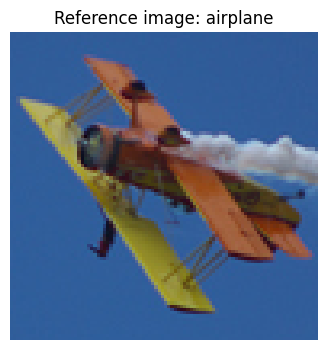

In [89]:
import matplotlib.pyplot as plt

img_index=10

reference_img, reference_label= test_dataset[img_index]

plt.figure(figsize=(4, 4))
plt.imshow(reference_img)
plt.title(f"Reference image: {test_dataset.classes[reference_label]}")
plt.axis("off")
plt.show()


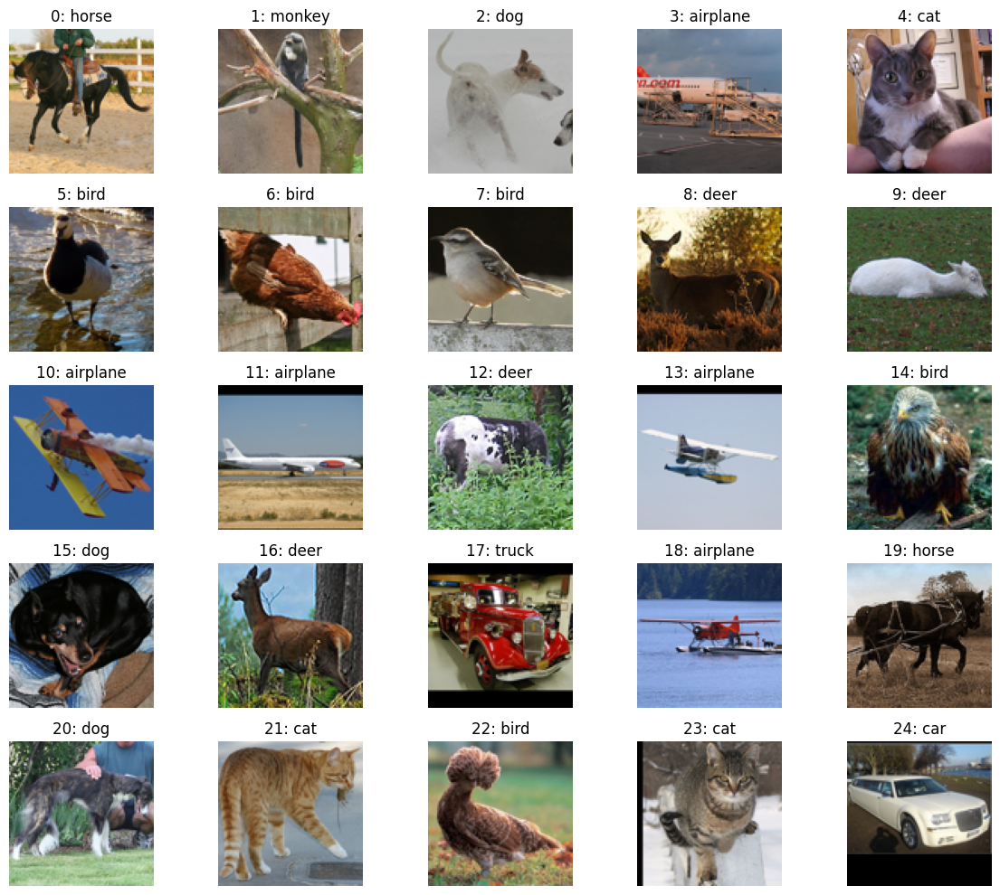

In [81]:
num_images = 25

fig, axes = plt.subplots(5, 5, figsize=(12, 10))

for i, ax in enumerate(axes.flat):
    img, label = test_dataset[i]

    ax.imshow(img)
    ax.set_title(f"{i}: {test_dataset.classes[label]}")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [90]:
from sklearn.cluster import KMeans

img_array = np.array(reference_img)

pixels = img_array.reshape(-1, 3)

#extracting 5 dominant colors
kmeans= KMeans(
    n_clusters=5,
    random_state=6304,
    n_init=10
)

kmeans.fit(pixels)

palette= kmeans.cluster_centers_.astype(np.uint8)

print(palette)

[[144 155 172]
 [ 65  44  39]
 [ 50  92 152]
 [151 134  82]
 [133  91  50]]


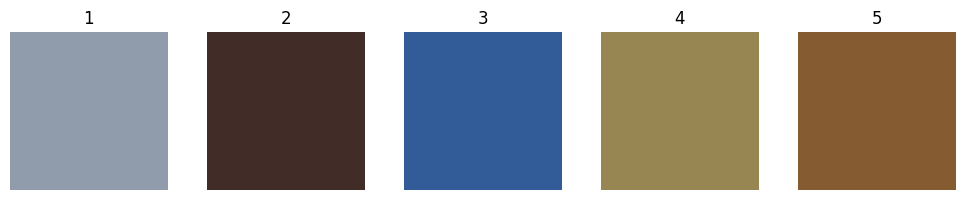

In [91]:
fig, axes = plt.subplots(1, 5, figsize=(10, 2))

for i, ax in enumerate(axes):
    color = palette[i] / 255.0

    ax.imshow([[color]])
    ax.axis("off")
    ax.set_title(str(i + 1))

plt.tight_layout()
plt.show()

In [92]:
import torch

palette_tensor= torch.tensor(palette / 255.0, dtype=torch.float32)

def apply_palette_transfer(img_tensor):
    c, h, w = img_tensor.shape
    pixels = img_tensor.permute(1, 2, 0).reshape(-1, 3)

    #compute squared distance from each pixel to each palette color
    distances = ((pixels[:, None, :] - palette_tensor[None, :, :]) ** 2).sum(dim=2)

    nearest_idx= distances.argmin(dim=1)

    #replacing each pixel with nearest palette color
    new_pixels= palette_tensor[nearest_idx]

    #reshaping back to [3, H, W]
    new_img = new_pixels.reshape(h, w, 3).permute(2, 0, 1)

    return new_img.clamp(0, 1) #shape [3,H,W]

In [93]:
palette_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Lambda(apply_palette_transfer)
])

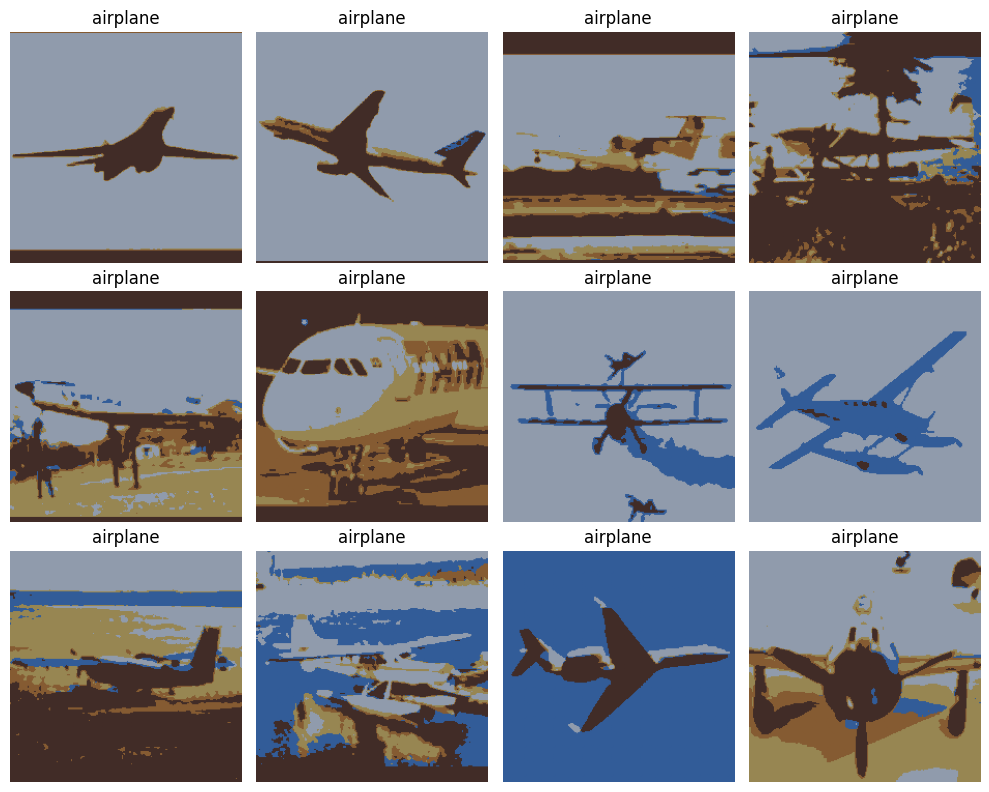

In [94]:
fig, axes = plt.subplots(3, 4, figsize=(10, 8))

for i, ax in enumerate(axes.flat):
    img, label = test_dataset[selected_test_idx[i]]

    x = palette_transform(img)

    ax.imshow(x.permute(1, 2, 0))
    ax.set_title(test_dataset.classes[label])
    ax.axis("off")

plt.tight_layout()
plt.show()

In [95]:
from skimage.color import rgb2lab, lab2rgb

ref_rgb = np.array(reference_img).astype(np.float32) / 255.0
ref_lab = rgb2lab(ref_rgb)

ref_a_mean = ref_lab[:, :, 1].mean()
ref_a_std  = ref_lab[:, :, 1].std()

ref_b_mean = ref_lab[:, :, 2].mean()
ref_b_std  = ref_lab[:, :, 2].std()

print(ref_a_mean, ref_a_std)
print(ref_b_mean, ref_b_std)

5.968085 7.197769
-19.869495 27.657701


In [96]:
def lab_palette_transfer(img_tensor):
    img_rgb = img_tensor.permute(1, 2, 0).numpy()

    img_lab = rgb2lab(img_rgb)

    #Keeping original luminance
    L = img_lab[:, :, 0]

    a = img_lab[:, :, 1]
    b = img_lab[:, :, 2]

    a_mean = a.mean()
    a_std = a.std()

    b_mean = b.mean()
    b_std = b.std()

    new_a = (
        (a - a_mean) / (a_std + 1e-6)
    ) * ref_a_std + ref_a_mean

    new_b = (
        (b - b_mean) / (b_std + 1e-6)
    ) * ref_b_std + ref_b_mean

    transferred_lab = np.stack(
        [L, new_a, new_b],
        axis=2
    )

    transferred_rgb = lab2rgb(transferred_lab)

    transferred_rgb = np.clip(
        transferred_rgb,
        0,
        1
    )

    return torch.tensor(
        transferred_rgb,
        dtype=torch.float32
    ).permute(2, 0, 1)

In [97]:
palette_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Lambda(lab_palette_transfer)
])

/tmp/ipykernel_1809/106623558.py:31: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 279 negative Z values that have been clipped to zero
  transferred_rgb = lab2rgb(transferred_lab)
/tmp/ipykernel_1809/106623558.py:31: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 696 negative Z values that have been clipped to zero
  transferred_rgb = lab2rgb(transferred_lab)


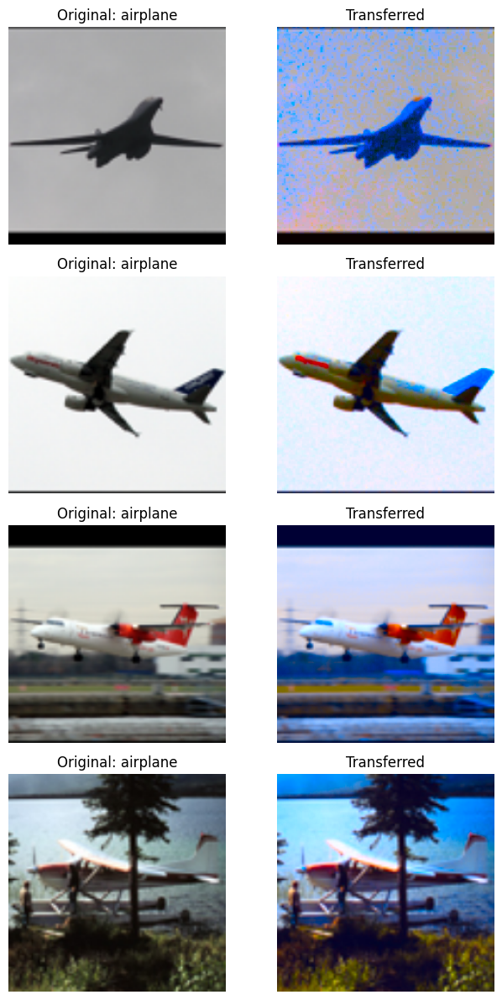

In [98]:
fig, axes = plt.subplots(4, 2, figsize=(7, 12))

for row in range(4):
    idx = selected_test_idx[row]
    img, label = test_dataset[idx]

    original = transforms.Resize((224, 224))(img)
    transferred = palette_transform(img)

    axes[row, 0].imshow(original)
    axes[row, 0].set_title(
        f"Original: {test_dataset.classes[label]}"
    )

    axes[row, 1].imshow(
        transferred.permute(1, 2, 0)
    )
    axes[row, 1].set_title("Transferred")

    axes[row, 0].axis("off")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

In [99]:
palette_imagenet_ds = ModiSTL10(
    test_dataset,
    selected_test_idx,
    palette_transform,
    imagenet_normalize
)

palette_clip_ds = ModiSTL10(
    test_dataset,
    selected_test_idx,
    palette_transform,
    clip_normalize
)

palette_imagenet_loader = DataLoader(
    palette_imagenet_ds,
    batch_size=64,
    shuffle=False,
    num_workers=2
)

palette_clip_loader = DataLoader(
    palette_clip_ds,
    batch_size=64,
    shuffle=False,
    num_workers=2
)

print(len(palette_imagenet_ds), len(palette_clip_ds))

500 500


In [100]:
resnet_palette_features, palette_labels = extract_features(
    resnet,
    palette_imagenet_loader,
    device
)

vit_palette_features, _ = extract_features(
    vit,
    palette_imagenet_loader,
    device
)

clip_palette_features, _ = extract_features(
    clip_model,
    palette_clip_loader,
    device,
    is_clip=True
)

print(resnet_palette_features.shape)
print(vit_palette_features.shape)
print(clip_palette_features.shape)

/tmp/ipykernel_1809/106623558.py:31: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 279 negative Z values that have been clipped to zero
  transferred_rgb = lab2rgb(transferred_lab)
/tmp/ipykernel_1809/106623558.py:31: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 696 negative Z values that have been clipped to zero
  transferred_rgb = lab2rgb(transferred_lab)
/tmp/ipykernel_1809/106623558.py:31: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1678 negative Z values that have been clipped to zero
  transferred_rgb = lab2rgb(transferred_lab)
/tmp/ipykernel_1809/106623558.py:31: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 42 negative Z values that have been clipped to zero
  transferred_rgb = lab2rgb(transferred_lab)
/tmp/ipykernel_1809/106623558.py:31: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 180 negative Z values that have b

torch.Size([500, 2048])
torch.Size([500, 768])
torch.Size([500, 512])


In [101]:
resnet_palette = evaluate_linear_head(
    resnet_head,
    resnet_palette_features,
    palette_labels,
    device
)

vit_palette = evaluate_linear_head(
    vit_head,
    vit_palette_features,
    palette_labels,
    device
)

clip_linear_palette = evaluate_linear_head(
    clip_head,
    clip_palette_features,
    palette_labels,
    device
)

In [102]:
with torch.no_grad():
    image_features = clip_palette_features.float().to(device)

    scale = clip_model.logit_scale.exp()
    logits = scale * image_features @ text_features.T
    probs = torch.softmax(logits, dim=1)

    palette_zero_confidence, palette_zero_predictions = probs.max(dim=1)

palette_zero_predictions = palette_zero_predictions.cpu()
palette_zero_confidence = palette_zero_confidence.cpu()

palette_zero_accuracy = (
    (palette_zero_predictions == palette_labels)
    .float()
    .mean()
    .item()
)

palette_zero_macro_f1 = f1_score(
    palette_labels.numpy(),
    palette_zero_predictions.numpy(),
    average="macro"
)

palette_zero_mean_confidence = palette_zero_confidence.mean().item()

clip_zeroshot_palette = {
    "accuracy": palette_zero_accuracy,
    "macro_f1": palette_zero_macro_f1,
    "mean_confidence": palette_zero_mean_confidence,
    "predictions": palette_zero_predictions,
    "confidence": palette_zero_confidence
}

In [104]:
resnet_palette_consistency = pred_consistency(
    resnet_clean["predictions"],
    resnet_palette["predictions"]
)

vit_palette_consistency = pred_consistency(
    vit_clean["predictions"],
    vit_palette["predictions"]
)

clip_linear_palette_consistency = pred_consistency(
    clip_linear_clean["predictions"],
    clip_linear_palette["predictions"]
)

clip_zeroshot_palette_consistency = pred_consistency(
    clip_zeroshot_clean["predictions"],
    clip_zeroshot_palette["predictions"]
)

In [106]:
palette_results = [
    ("ResNet", resnet_clean, resnet_palette, resnet_palette_consistency),
    ("ViT", vit_clean, vit_palette, vit_palette_consistency),
    ("CLIP Linear", clip_linear_clean, clip_linear_palette, clip_linear_palette_consistency),
    ("CLIP Zero-shot", clip_zeroshot_clean, clip_zeroshot_palette, clip_zeroshot_palette_consistency),
]

for name, clean_result, pal_result, consistency in palette_results:
    accuracy_drop = pal_result["accuracy"] - clean_result["accuracy"]

    print(
        f"{name:15s} | "
        f"Palette Acc: {pal_result['accuracy']:.4f} | "
        f"Accuracy Change: {accuracy_drop:.4f} | "
        f"Palette F1: {pal_result['macro_f1']:.4f} | "
        f"Palette Conf: {pal_result['mean_confidence']:.4f} | "
        f"Consistency: {consistency:.4f}"
    )

ResNet          | Palette Acc: 0.9180 | Accuracy Change: -0.0560 | Palette F1: 0.9173 | Palette Conf: 0.8827 | Consistency: 0.9320
ViT             | Palette Acc: 0.9500 | Accuracy Change: -0.0280 | Palette F1: 0.9500 | Palette Conf: 0.9162 | Consistency: 0.9620
CLIP Linear     | Palette Acc: 0.9480 | Accuracy Change: -0.0260 | Palette F1: 0.9476 | Palette Conf: 0.2793 | Consistency: 0.9560
CLIP Zero-shot  | Palette Acc: 0.9240 | Accuracy Change: -0.0420 | Palette F1: 0.9224 | Palette Conf: 0.9207 | Consistency: 0.9440


###Shape vs Texture:

In [107]:
SEED = 6304
rando= np.random.default_rng(SEED)

cue_pairs = [
    ("cat", "airplane"),
    ("deer", "truck"),
    ("dog", "ship"),
    ("monkey", "car"),
    ("horse", "bird"),
]

class_to_idx= {
    class_name: i
    for i, class_name in enumerate(test_dataset.classes)
}

In [108]:
directed_pairs = []

for class_a, class_b in cue_pairs:
    directed_pairs.append((class_a, class_b))
    directed_pairs.append((class_b, class_a))

print(directed_pairs)

[('cat', 'airplane'), ('airplane', 'cat'), ('deer', 'truck'), ('truck', 'deer'), ('dog', 'ship'), ('ship', 'dog'), ('monkey', 'car'), ('car', 'monkey'), ('horse', 'bird'), ('bird', 'horse')]


In [110]:
test_targets = np.array(test_dataset.labels)

indices_by_class = {}

for class_name, class_idx in class_to_idx.items():
    indices_by_class[class_name] = np.where(
        test_targets == class_idx
    )[0]

Num_dire= 25

cue_candidates = []

for shape_class, texture_class in directed_pairs:

    shape_pool = indices_by_class[shape_class]
    texture_pool = indices_by_class[texture_class]

    shape_indices = rando.choice(
        shape_pool,
        size=Num_dire,
        replace=False
    )

    texture_indices = rando.choice(
        texture_pool,
        size=Num_dire,
        replace=False
    )

    for shape_idx, texture_idx in zip(
        shape_indices,
        texture_indices
    ):
        cue_candidates.append({
            "shape_class": shape_class,
            "texture_class": texture_class,
            "shape_idx": int(shape_idx),
            "texture_idx": int(texture_idx),
        })

In [111]:
for item in cue_candidates[:5]:
    print(item)

{'shape_class': 'cat', 'texture_class': 'airplane', 'shape_idx': 4572, 'texture_idx': 1123}
{'shape_class': 'cat', 'texture_class': 'airplane', 'shape_idx': 3232, 'texture_idx': 2518}
{'shape_class': 'cat', 'texture_class': 'airplane', 'shape_idx': 3293, 'texture_idx': 7430}
{'shape_class': 'cat', 'texture_class': 'airplane', 'shape_idx': 7159, 'texture_idx': 284}
{'shape_class': 'cat', 'texture_class': 'airplane', 'shape_idx': 7583, 'texture_idx': 3022}


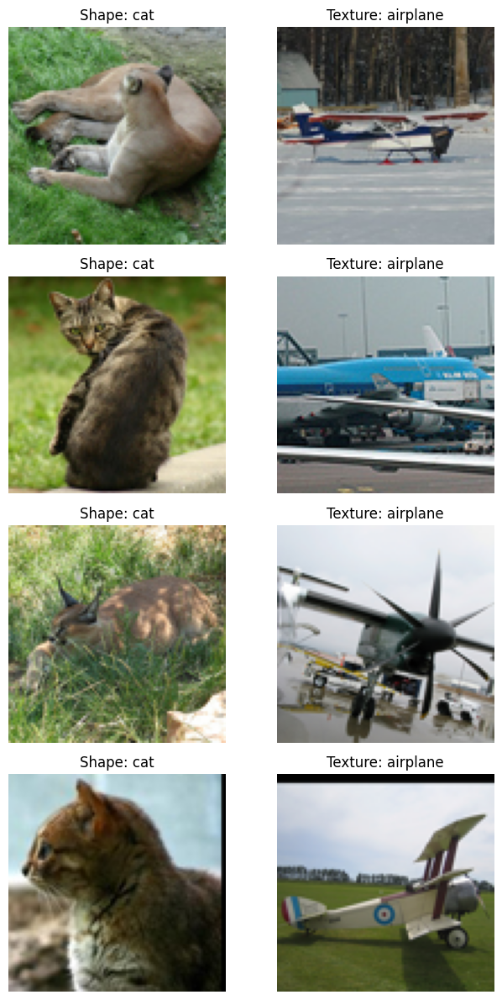

In [112]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(4, 2, figsize=(7, 12))

for row, item in enumerate(cue_candidates[:4]):

    shape_img, _ = test_dataset[item["shape_idx"]]
    texture_img, _ = test_dataset[item["texture_idx"]]

    axes[row, 0].imshow(shape_img)
    axes[row, 0].set_title(
        f"Shape: {item['shape_class']}"
    )

    axes[row, 1].imshow(texture_img)
    axes[row, 1].set_title(
        f"Texture: {item['texture_class']}"
    )

    axes[row, 0].axis("off")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

In [113]:
!git clone https://github.com/naoto0804/pytorch-AdaIN.git

Cloning into 'pytorch-AdaIN'...
remote: Enumerating objects: 344, done.
remote: Counting objects: 100% (80/80), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 344 (delta 71), reused 60 (delta 60), pack-reused 264 (from 3)
Receiving objects: 100% (344/344), 7.80 MiB | 25.35 MiB/s, done.
Resolving deltas: 100% (170/170), done.


In [114]:
%cd pytorch-AdaIN

/content/pytorch-AdaIN


In [115]:
!mkdir -p models

!wget -q https://github.com/naoto0804/pytorch-AdaIN/releases/download/v0.0.0/vgg_normalised.pth \
    -O models/vgg_normalised.pth

!wget -q https://github.com/naoto0804/pytorch-AdaIN/releases/download/v0.0.0/decoder.pth \
    -O models/decoder.pth

In [116]:
import torch
import torch.nn as nn
from torchvision import transforms
import net
from function import adaptive_instance_normalization

adain_device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

decoder = net.decoder
vgg = net.vgg

decoder.eval()
vgg.eval()

decoder.load_state_dict(
    torch.load("models/decoder.pth", map_location=adain_device)
)

vgg.load_state_dict(
    torch.load("models/vgg_normalised.pth", map_location=adain_device)
)

vgg= nn.Sequential(*list(vgg.children())[:31])

vgg= vgg.to(adain_device)
decoder = decoder.to(adain_device)

In [117]:
def adain_transfer(content_img, style_img, alpha=1.0):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])

    content = transform(content_img).unsqueeze(0).to(adain_device)
    style = transform(style_img).unsqueeze(0).to(adain_device)

    with torch.no_grad():
        content_f = vgg(content)
        style_f = vgg(style)

        feat = adaptive_instance_normalization(
            content_f,
            style_f
        )

        feat = alpha * feat + (1 - alpha) * content_f

        output = decoder(feat)

    return output.squeeze(0).cpu().clamp(0, 1)

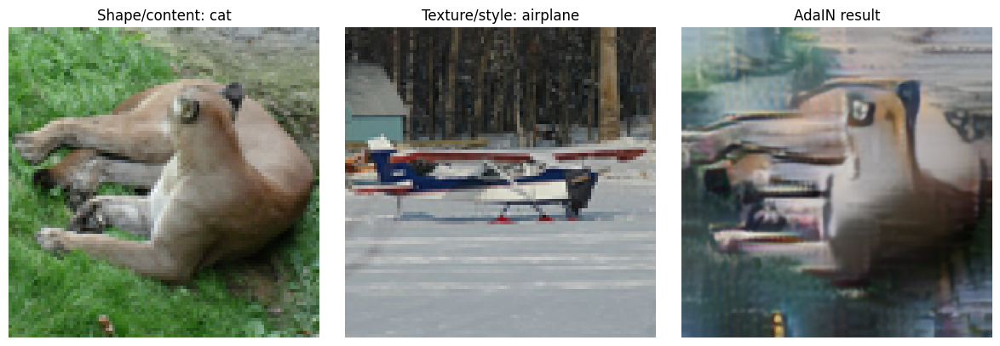

In [118]:
item = cue_candidates[0]

content_img, _ = test_dataset[item["shape_idx"]]
style_img, _ = test_dataset[item["texture_idx"]]

stylized = adain_transfer(
    content_img,
    style_img,
    alpha=1.0
)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(content_img)
axes[0].set_title(
    f"Shape/content: {item['shape_class']}"
)
axes[0].axis("off")

axes[1].imshow(style_img)
axes[1].set_title(
    f"Texture/style: {item['texture_class']}"
)
axes[1].axis("off")

axes[2].imshow(stylized.permute(1, 2, 0))
axes[2].set_title("AdaIN result")
axes[2].axis("off")

plt.tight_layout()
plt.show()

In [119]:

from torchvision.utils import save_image

CUE_DIR = "/content/gdrive/MyDrive/atml_PA1/cue_conflicts"
CANDIDATE_IMG_DIR = os.path.join(CUE_DIR, "candidate_images")
VALID_IMG_DIR = os.path.join(CUE_DIR, "valid_images")

os.makedirs(CUE_DIR, exist_ok=True)
os.makedirs(CANDIDATE_IMG_DIR, exist_ok=True)
os.makedirs(VALID_IMG_DIR, exist_ok=True)

In [127]:
from tqdm import tqdm

candidate_metadata = []

for i, item in enumerate(tqdm(cue_candidates)):
    content_img, _ = test_dataset[item["shape_idx"]]
    style_img, _ = test_dataset[item["texture_idx"]]

    stylized = adain_transfer(
        content_img,
        style_img,
        alpha=0.5
    )

    filename = f"candidate_{i:03d}.png"
    save_path = os.path.join(CANDIDATE_IMG_DIR, filename)

    save_image(stylized, save_path)

    candidate_metadata.append({
        "candidate_id": i,
        "filename": filename,
        "path": save_path,
        "shape_class": item["shape_class"],
        "texture_class": item["texture_class"],
        "shape_idx": item["shape_idx"],
        "texture_idx": item["texture_idx"],
    })

100%|██████████| 250/250 [00:14<00:00, 17.36it/s]


In [128]:
metadata_path = os.path.join(CUE_DIR, "candidate_metadata.json")

with open(metadata_path, "w") as f:
    json.dump(candidate_metadata, f, indent=2)

print("Saved candidate metadata to:", metadata_path)
print("Total candidates:", len(candidate_metadata))

Saved candidate metadata to: /content/gdrive/MyDrive/atml_PA1/cue_conflicts/candidate_metadata.json
Total candidates: 250


In [129]:
import matplotlib.pyplot as plt
from PIL import Image

def show_candidate_batch(candidate_metadata, start=0, batch_size=6):
    end = min(start + batch_size, len(candidate_metadata))
    batch = candidate_metadata[start:end]

    fig, axes = plt.subplots(len(batch), 3, figsize=(10, 4 * len(batch)))

    if len(batch) == 1:
        axes = [axes]

    for row, item in enumerate(batch):
        content_img, _ = test_dataset[item["shape_idx"]]
        style_img, _ = test_dataset[item["texture_idx"]]
        stylized_img = Image.open(item["path"])

        axes[row][0].imshow(content_img)
        axes[row][0].set_title(
            f"ID {item['candidate_id']} | Shape: {item['shape_class']}"
        )
        axes[row][0].axis("off")

        axes[row][1].imshow(style_img)
        axes[row][1].set_title(
            f"Texture: {item['texture_class']}"
        )
        axes[row][1].axis("off")

        axes[row][2].imshow(stylized_img)
        axes[row][2].set_title("Stylized")
        axes[row][2].axis("off")

    plt.tight_layout()
    plt.show()

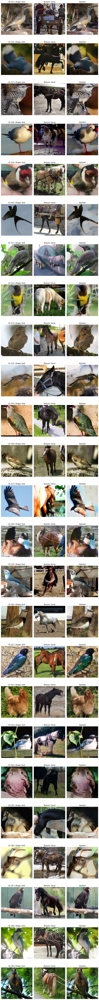

In [153]:
show_candidate_batch(candidate_metadata, start=225, batch_size=25)

In [133]:
kept_ids = [0, 1, 3, 4, 6, 8, 9]


In [134]:
kept_ids.extend([11,12,13,14,15,16,17,18,20,21,22,23,24])

In [136]:
kept_ids.extend([25, 28,29, 30, 31, 33, 34,35, 37,38,39,41,42,43,44,45,46,47,48,49])

In [140]:
kept_ids.extend([51,52,53,54,55,56,58,59,60,61,62,64,66,67,68,69,70,72,74])

In [142]:
kept_ids.extend([
    75, 76, 77, 78, 79, 80,
    82, 83, 84, 85,
    87, 88, 89,
    91, 92, 93, 94,
    97, 98, 99, 100
])

In [144]:
kept_ids.extend([
    101, 104, 105, 106, 107, 108, 109,
    111, 113,
    115, 116, 117, 118, 119, 120,
    121, 122, 123, 124,125
])

In [146]:
kept_ids.extend([
    126, 128, 130,
    132, 133, 134, 135, 136, 137, 138,
    140, 141, 142, 143,
    145, 146, 147, 148, 149
])

In [148]:
kept_ids.extend([
    150, 151, 152,
    155, 156,
    158, 159, 160, 161, 162, 163, 164, 165, 166,
    168, 169,
    171, 172, 173, 174
])

In [150]:
kept_ids.extend([
    175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185,
    187, 188, 189, 190, 191, 192, 193, 194,
    198, 199
])

In [152]:
kept_ids.extend([
    200, 201, 202,
    204,
    206, 207, 208, 209, 210, 211, 212, 213, 214, 215,
    216, 217, 218, 219,
    221, 223
])

In [154]:
kept_ids.extend([
    225, 226,
    228,
    231, 232, 233, 234, 235, 236, 237, 238, 239,
    240, 241, 242,
    245, 246, 247, 248, 249
])

In [156]:
len(set(kept_ids))
print(kept_ids)

[0, 1, 3, 4, 6, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24, 25, 28, 29, 30, 31, 33, 34, 35, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 58, 59, 60, 61, 62, 64, 66, 67, 68, 69, 70, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84, 85, 87, 88, 89, 91, 92, 93, 94, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 111, 113, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 128, 130, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 145, 146, 147, 148, 149, 150, 151, 152, 155, 156, 158, 159, 160, 161, 162, 163, 164, 165, 166, 168, 169, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 187, 188, 189, 190, 191, 192, 193, 194, 198, 199, 200, 201, 202, 204, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 221, 223, 225, 226, 228, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 245, 246, 247, 248, 249]


In [157]:
valid_conflicts = [
    item for item in candidate_metadata
    if item["candidate_id"] in set(kept_ids)
]

print(len(valid_conflicts))

200


In [158]:
valid_metadata_path = os.path.join(
    CUE_DIR,
    "valid_conflicts.json"
)

with open(valid_metadata_path, "w") as f:
    json.dump(valid_conflicts, f, indent=2)

In [159]:
from PIL import Image
from torch.utils.data import Dataset, DataLoader

class CueConflictDataset(Dataset):
    def __init__(self, metadata, normalize):
        self.metadata = metadata
        self.normalize = normalize

        self.base_transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, i):
        item = self.metadata[i]

        image = Image.open(item["path"]).convert("RGB")

        image = self.base_transform(image)
        image = self.normalize(image)

        shape_label = class_to_idx[item["shape_class"]]
        texture_label = class_to_idx[item["texture_class"]]

        return (
            image,
            shape_label,
            texture_label,
            item["candidate_id"]
        )

In [160]:
cue_imagenet_ds = CueConflictDataset(
    valid_conflicts,
    imagenet_normalize
)

cue_clip_ds = CueConflictDataset(
    valid_conflicts,
    clip_normalize
)

cue_imagenet_loader = DataLoader(
    cue_imagenet_ds,
    batch_size=64,
    shuffle=False,
    num_workers=2
)

cue_clip_loader = DataLoader(
    cue_clip_ds,
    batch_size=64,
    shuffle=False,
    num_workers=2
)

print(len(cue_imagenet_ds), len(cue_clip_ds))

200 200


In [161]:
def predict_conflicts(backbone, head, loader, device, is_clip=False):
    all_preds = []
    all_shape = []
    all_texture = []
    all_ids = []

    backbone.eval()
    head.eval()

    with torch.no_grad():
        for images, shape_labels, texture_labels, candidate_ids in loader:

            images = images.to(device)

            if is_clip:
                features = backbone.encode_image(images)
                features = features / features.norm(
                    dim=-1,
                    keepdim=True
                )
            else:
                features = backbone(images)

            logits = head(features.float())
            predictions = logits.argmax(dim=1)

            all_preds.append(predictions.cpu())
            all_shape.append(shape_labels)
            all_texture.append(texture_labels)
            all_ids.append(candidate_ids)

    return {
        "predictions": torch.cat(all_preds),
        "shape_labels": torch.cat(all_shape),
        "texture_labels": torch.cat(all_texture),
        "candidate_ids": torch.cat(all_ids)
    }

In [162]:
resnet_cue = predict_conflicts(
    resnet,
    resnet_head,
    cue_imagenet_loader,
    device
)

vit_cue = predict_conflicts(
    vit,
    vit_head,
    cue_imagenet_loader,
    device
)

clip_linear_cue = predict_conflicts(
    clip_model,
    clip_head,
    cue_clip_loader,
    device,
    is_clip=True
)

In [163]:
zero_preds = []
zero_shape = []
zero_texture = []
zero_ids = []

clip_model.eval()

with torch.no_grad():
    for images, shape_labels, texture_labels, candidate_ids in cue_clip_loader:

        images = images.to(device)

        image_features = clip_model.encode_image(images)
        image_features = image_features / image_features.norm(
            dim=-1,
            keepdim=True
        )

        scale = clip_model.logit_scale.exp()

        logits = scale * image_features @ text_features.T
        predictions = logits.argmax(dim=1)

        zero_preds.append(predictions.cpu())
        zero_shape.append(shape_labels)
        zero_texture.append(texture_labels)
        zero_ids.append(candidate_ids)

clip_zeroshot_cue = {
    "predictions": torch.cat(zero_preds),
    "shape_labels": torch.cat(zero_shape),
    "texture_labels": torch.cat(zero_texture),
    "candidate_ids": torch.cat(zero_ids)
}

In [164]:
def compute_cue_metrics(result):
    preds = result["predictions"]
    shape = result["shape_labels"]
    texture = result["texture_labels"]

    shape_mask = preds == shape
    texture_mask = preds == texture

    n_shape = shape_mask.sum().item()
    n_texture = texture_mask.sum().item()

    n_total = len(preds)

    n_other = n_total - n_shape - n_texture

    shape_bias = (
        100 * n_shape / (n_shape + n_texture)
        if (n_shape + n_texture) > 0
        else 0
    )

    coverage = (
        100 * (n_shape + n_texture) / n_total
    )

    return {
        "shape": n_shape,
        "texture": n_texture,
        "other": n_other,
        "shape_bias": shape_bias,
        "coverage": coverage
    }

In [165]:
resnet_cue_metrics = compute_cue_metrics(resnet_cue)
vit_cue_metrics = compute_cue_metrics(vit_cue)
clip_linear_cue_metrics = compute_cue_metrics(clip_linear_cue)
clip_zeroshot_cue_metrics = compute_cue_metrics(clip_zeroshot_cue)

cue_results = [
    ("ResNet", resnet_cue_metrics),
    ("ViT", vit_cue_metrics),
    ("CLIP Linear", clip_linear_cue_metrics),
    ("CLIP Zero-shot", clip_zeroshot_cue_metrics)
]

for name, r in cue_results:
    print(
        f"{name:15s} | "
        f"Shape: {r['shape']:3d} | "
        f"Texture: {r['texture']:3d} | "
        f"Other: {r['other']:3d} | "
        f"Shape Bias: {r['shape_bias']:.1f}% | "
        f"Coverage: {r['coverage']:.1f}%"
    )

ResNet          | Shape: 161 | Texture:   0 | Other:  39 | Shape Bias: 100.0% | Coverage: 80.5%
ViT             | Shape: 176 | Texture:   1 | Other:  23 | Shape Bias: 99.4% | Coverage: 88.5%
CLIP Linear     | Shape: 175 | Texture:   1 | Other:  24 | Shape Bias: 99.4% | Coverage: 88.0%
CLIP Zero-shot  | Shape: 165 | Texture:   1 | Other:  34 | Shape Bias: 99.4% | Coverage: 83.0%


###Translation: